# Welcome to the Cloud to Street Climate Data Scientist Challenge

Hello! This challenge is designed to test your skills in summarizing data, thinking through open problems, and assessing models in low/complex data environments. It consists of three tasks.

Depending on how often you have done such tasks, the challenge as a whole can take longer or shorter. We aim for 3 hours overall and don't expect your solution to be perfect, but to showcase your skills and inform the questions we will ask in interviews.

You can (and we encourage due to time constraints) re-use code from open sources or your own personal work as long as you cite them.

When you are done, please send in your solutions for Task 1 and 2 as instructed in the email you received.


# Task 1: How can we leverage mutliple data sources to produce a single flood map?

This task is designed to assess the your ability to query, pre-process, inspect, and validate a diverse range of data sources, especially remotely sensed data, to inform and validate flood models.

Given $N$ candidate input raster layers, $\textbf{X} = \{{X_1, X_2, ..., X_N}\}$, we at Cloud to Street would like to learn the parameters of some model $f(X)$ that can predict the fractional flooded area of a grid cell (pixel) $Y$.

We would like you to **complete an exploratory data analysis of some candidate input rasters**, $\textbf{X}$, in the context of this floodmapping task. Your analysis at minimum should include:
1. A quantitative summary of each candidate layer
2. A visual summary of quantiles and outliers in each data layer.
3. Discussion of the merits/drawbacks of these layers. At minimum, you should comment on:
  * Which data layers appear to have the "richest" information about flooding and why?
  * Which data layers appear to have the "least" amount of information about flooding and why?
4. Potential preprocessing steps you would apply to any of the layers prior to training a model? If so, be specific about:
  * which layer(s)
  * what transformation(s) and provide examples with code and visualizations where possible
  * What classes of models would the transformation be appropriate for (ex. Random Forests, SVMs, Logistic Regression, Convolutional Networks)
5. Additional commentory with considerations for modelling or determining what models are appropriate.

Use whichever technology and/or programming language you are most comfortable with to complete the task. You can use a copy of this Google Colab, or create your own code, noteboook, etc. Your submission should contain all the necessary instructions and files to recreate your result (jupyter notebooks, source code, execution instructions, python/R/Matlab version).

We will grade this task purely on the results of the analysis, with the requirement that the submitted code should be able to run as instructed and readable. No assessment of code style or quality will be made. 





In [ ]:
!pip install rasterio gsutil

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 19.3 MB 1.2 MB/s 
     |████████████████████████████████| 3.0 MB 43.1 MB/s 
     |████████████████████████████████| 135 kB 42.6 MB/s 
     |████████████████████████████████| 96 kB 5.9 MB/s 
     |████████████████████████████████| 57 kB 2.6 MB/s 
     |████████████████████████████████| 1.4 MB 44.0 MB/s 
     |████████████████████████████████| 4.1 MB 43.6 MB/s 
  Created wheel for gsutil: filename=gsutil-5.16-py3-none-any.whl size=3773475 sha256=62ad7398497ae48703ecfaaf88494b46aa43673b0370495540f69354b6387f10
  Stored in directory: /root/.cache/pip/wheels/86/d8/a1/9791268be3b104b008456bd3ace76f9397afb1bea982bb0724
  Created wheel for gcs-oauth2-boto-plugin: filename=gcs_oauth2_boto_plugin-3.0-py3-none-any.whl size=23221 sha256=84e6a6fd2ed63833feac7e02d16fa9983df864e54712fa27c1adb264e06c5cc5
  Stored in directory: /root/.cache/pip/wheels/2a/93/86/cb214

In [1]:
import pandas as pd

In [ ]:
from pathlib import Path
from pprint import pprint

import numpy as np
import pandas as pd
import rasterio as rio
import matplotlib.pyplot as plt
from matplotlib import image as mpimg
from mpl_toolkits.axes_grid1 import make_axes_locatable

# 1.1 Pull and organize our exploratory data

We have 6 "training examples" we've prepared for you to explore.

In [2]:
# copy our data to your environment
!gsutil -m cp -r gs://c2s_developer_exercise/climate_data_scientist/data .

Copying gs://c2s_developer_exercise/climate_data_scientist/data/MOD09GA.A2001352.h10v05.006.2015146051459__512-1024/imagery/sm_t0.tif...
Copying gs://c2s_developer_exercise/climate_data_scientist/data/MOD09GA.A2008169.h11v04.006.2015175230035__512-1024/imagery/flow_acc.tif...
/ [0/104 files][    0.0 B/ 49.9 MiB]   0% Done                                  
Copying gs://c2s_developer_exercise/climate_data_scientist/data/MOD09GA.A2001352.h10v05.006.2015146051459__512-1024/imagery/sm_tm48_tm24.tif...
/ [0/104 files][    0.0 B/ 49.9 MiB]   0% Done                                  
Copying gs://c2s_developer_exercise/climate_data_scientist/data/MOD09GA.A2001352.h10v05.006.2015146051459__512-1024/imagery/gridmet_pr_5days.tif...
/ [0/104 files][    0.0 B/ 49.9 MiB]   0% Done                                  
Copying gs://c2s_developer_exercise/climate_data_scientist/data/MOD09GA.A2001352.h10v05.006.2015146051459__512-1024/imagery/flow_acc.tif...
/ [0/104 files][    0.0 B/ 49.9 MiB]   0% Done  

In [ ]:
DATADIR = Path('./data')

In [ ]:
df = pd.DataFrame({'example_dir': DATADIR.glob('M*')})
df['unique_id'] = df.example_dir.apply(lambda x: str(x).split('/')[-1])
df['image_dir'] = df.example_dir.apply(lambda x: x/'imagery')
df['label_dir'] = df.example_dir.apply(lambda x: x/'label')

# static layers: do not change hour-to-hour
df['flow_direction_path'] = df.image_dir.apply(lambda x: x/'flow_dir.tif')
df['flow_accumulation_path'] = df.image_dir.apply(lambda x: x/'flow_acc.tif')
df['height_above_nearest_drainage_path'] = df.image_dir.apply(lambda x: x/'hand.tif')
df['global_surface_water_path'] = df.image_dir.apply(lambda x: x/'GSW.tif')
df['floodmap_target_label_path'] = df.label_dir.apply(lambda x: x/'floodmap_v0_11_with_cloudmask.tif')

# dynamic layers: changing over time
df['precip_1day_sum_path'] = df.image_dir.apply(lambda x: x/'gridmet_pr.tif')
df['precip_3days_sum_path'] = df.image_dir.apply(lambda x: x/'gridmet_pr_3days.tif')
df['precip_5days_sum_path'] = df.image_dir.apply(lambda x: x/'gridmet_pr_5days.tif')
df['precip_7days_sum_path'] = df.image_dir.apply(lambda x: x/'gridmet_pr_7days.tif')
df['nwm_routing_prev_72h_mean_path'] = df.image_dir.apply(lambda x: x/'rt_72h_mean.tif')
df['nwm_routing_prev_72h_max_path'] = df.image_dir.apply(lambda x: x/'rt_72h_max.tif')

df['nwm_soil_moisture_t0_path'] = df.image_dir.apply(lambda x: x/'sm_t0.tif')
df['nwm_soil_moisture_tm24_tm0_path'] = df.image_dir.apply(lambda x: x/'sm_tm24_tm0.tif')
df['nwm_soil_moisture_tm48_tm24_path'] = df.image_dir.apply(lambda x: x/'sm_tm48_tm24.tif')
df['nwm_soil_moisture_tm72_tm48_path'] = df.image_dir.apply(lambda x: x/'sm_tm72_tm48.tif')

df['nwm_streamflow_linear_interpolation_path'] = df.image_dir.apply(lambda x: x/'streamflow.tif')


In [ ]:
df.head()

,example_dir,unique_id,image_dir,label_dir,flow_direction_path,flow_accumulation_path,height_above_nearest_drainage_path,global_surface_water_path,floodmap_target_label_path,precip_1day_sum_path,precip_3days_sum_path,precip_5days_sum_path,precip_7days_sum_path,nwm_routing_prev_72h_mean_path,nwm_routing_prev_72h_max_path,nwm_soil_moisture_t0_path,nwm_soil_moisture_tm24_tm0_path,nwm_soil_moisture_tm48_tm24_path,nwm_soil_moisture_tm72_tm48_path,nwm_streamflow_linear_interpolation_path
0,data/MYD09GA.A2005256.h10v06.006.2015108002700...,MYD09GA.A2005256.h10v06.006.2015108002700__512...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...,data/MYD09GA.A2005256.h10v06.006.2015108002700...
1,data/MOD09GA.A2011126.h10v05.006.2015218092242...,MOD09GA.A2011126.h10v05.006.2015218092242__512...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...,data/MOD09GA.A2011126.h10v05.006.2015218092242...
2,data/MOD09GA.A2008169.h11v04.006.2015175230035...,MOD09GA.A2008169.h11v04.006.2015175230035__512...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...,data/MOD09GA.A2008169.h11v04.006.2015175230035...
3,data/MOD09GA.A2001352.h10v05.006.2015146051459...,MOD09GA.A2001352.h10v05.006.2015146051459__512...,data/MOD09GA.A2001352.h10v05.006.2015146051459...,data/MOD09GA.A2001352.h10v05.006.2015146051459...,data/MOD09GA.A2001352.h10v05.006.2015146051459...,data/MOD09GA.A2001352.h10v05.006.2015146051459...,data/MOD09GA.A2001352.h10v05.006.2015146051459...,data/MOD09GA.A2001352.h10v05.006.2015146051459...,data/MOD09GA.A2001352.h10v05.006.2015146051459...,data/MOD09GA.A2001352.h10v05.006.2015146051459...,data/

## 1.2 Visualize the data

Below is a summary description of each layer. You are not expected to be a domain expert in any of these layers. You will be assessed based on your ability to provide statistical summaries of the layers and ground your insights into how to use them in modelling based on these summaries.


| **Layer**                           | **Static or Dynamic?** | **Units**  | **Bounds**                                  | **Definition**                                                                                                                                                                                            |
|-------------------------------------|------------------------|------------|---------------------------------------------|-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| Floodmap Target Label               | Dynamic                | percentage | [0,100]                                     | Fractional flooded area of a 250m x 250m grid cell (pixel). What we are trying to model                                                                                                                   |
| Global Surface Water                | Static                 | percentage | [0,100]                                     | Probability of observed water in the grid cell. Comes from the JRC: https://global-surface-water.appspot.com                                                                                              |
| Flow Direction                      | Static                 | n/a        | [-1,  1,   2,   4,   8,  16,  32,  64, 128] | 2^n, where n is a direction value from 1-8. That means unique data values in the data are: [-1,  1,   2,   4,   8,  16,  32,  64, 128] These values are an ordering of 45 degrees  --> [45, 90, ..., 360] |
| Flow Accumulation                   | Static                 | cells      | [0, infinity]                               | How many upstream gridcells flow into this gridcell                                                                                                                                                       |
| Precip 1 day sum                    | Dynamic                | mm^3       | [0, infinity]                               | The sum of precipitation in this gridcell from midnight - midnight of the date of observation                                                                                                             |
| Precip 3 day sum                    | Dynamic                | mm^3       | [0, infinity]                               | The sum of precipitation in this gridcell for the previous 3 days                                                                                                                                         |
| Precip 5 day sum                    | Dynamic                | mm^3       | [0, infinity]                               | The sum of precipitation in this gridcell for the previous 5 days                                                                                                                                         |
| Precip 7 day sum                    | Dynamic                | mm^3       | [0, infinity]                               | The sum of precipitation in this gridcell for the previous 7 days                                                                                                                                         |
| Height Above Nearest Drainage       | Static                 | m          | [0, infinity]                               | The height of a gridcell from it's nearest drainage point                                                                                                                                                 |
| NWM Routing Previous 72h Mean       | Dynamic                | mm^3       | [0, infinity]                               | The average volume of ponded water on the surface that the US National Water Model modelled to pass through this grid cell over the previous 72h                                                          |
| NWM Routing Previous 72h Max        | Dynamic                | mm^3       | [0, infinity]                               | The maximum volume of ponded water on the surface that the US National Water Model modelled to pass through this grid cell over the previous 72h                                                          |
| NWM Streamflow Linear Interpolation | Dynamic                | mm^3       | [0, infinity]                               | The volume of water to pass through a streams in this grid cell. Values are linearly interpolated across gridcells outside of streams to form a raster.                                                   |
| NWM Soil Moisture t0                | Dynamic                | unitless   | [0, 100]                                    | Volumetric soil moisture at the time of the floodmap, the dimensionless ratio of water volume (m3) to soil volume (m3)                                                                                    |
| NWM Soil Moisture tm24-tm0          | Dynamic                | unitless   | [0, 100]                                    | Average volumetric soil moisture of the previous 24 hours prior to the floodmap time, the dimensionless ratio of water volume (m3) to soil volume (m3)                                                    |
| NWM Soil Moisture tm48-tm24         | Dynamic                | unitless   | [0, 100]                                    | Average volumetric soil moisture between 48-24 huors prior to the floodmap time, the dimensionless ratio of water volume (m3) to soil volume (m3)                                                         |
| NWM Soil Moisture tm72-tm48         | Dynamic                | unitless   | [0, 100]                                    | Average volumetric soil moisture between 72-48 huors prior to the floodmap time, the dimensionless ratio of water volume (m3) to soil volume (m3)                                                         |

In [ ]:
# ordered list of fields to visualize
fields_to_visualize = [
 'floodmap_target_label_path',    
 'global_surface_water_path',     
 'flow_direction_path',
 'flow_accumulation_path',

 'precip_1day_sum_path',
 'precip_3days_sum_path',
 'precip_5days_sum_path',
 'precip_7days_sum_path',
 
 'height_above_nearest_drainage_path',
 'nwm_routing_prev_72h_mean_path',
 'nwm_routing_prev_72h_max_path',
 'nwm_streamflow_linear_interpolation_path',
 
 'nwm_soil_moisture_t0_path',
 'nwm_soil_moisture_tm24_tm0_path',
 'nwm_soil_moisture_tm48_tm24_path',
 'nwm_soil_moisture_tm72_tm48_path',
 ]
len(fields_to_visualize)

16

0 MYD09GA.A2005256.h10v06.006.2015108002700__512-684


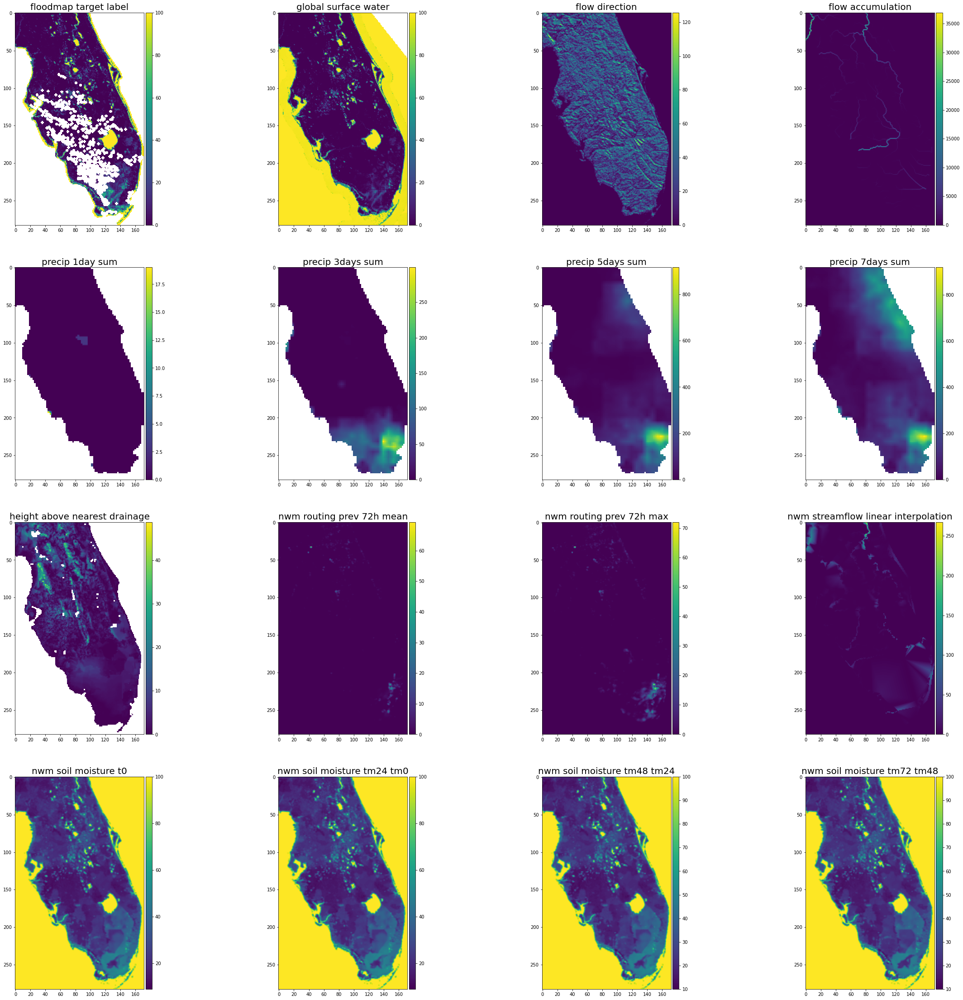

1 MOD09GA.A2011126.h10v05.006.2015218092242__512-1024


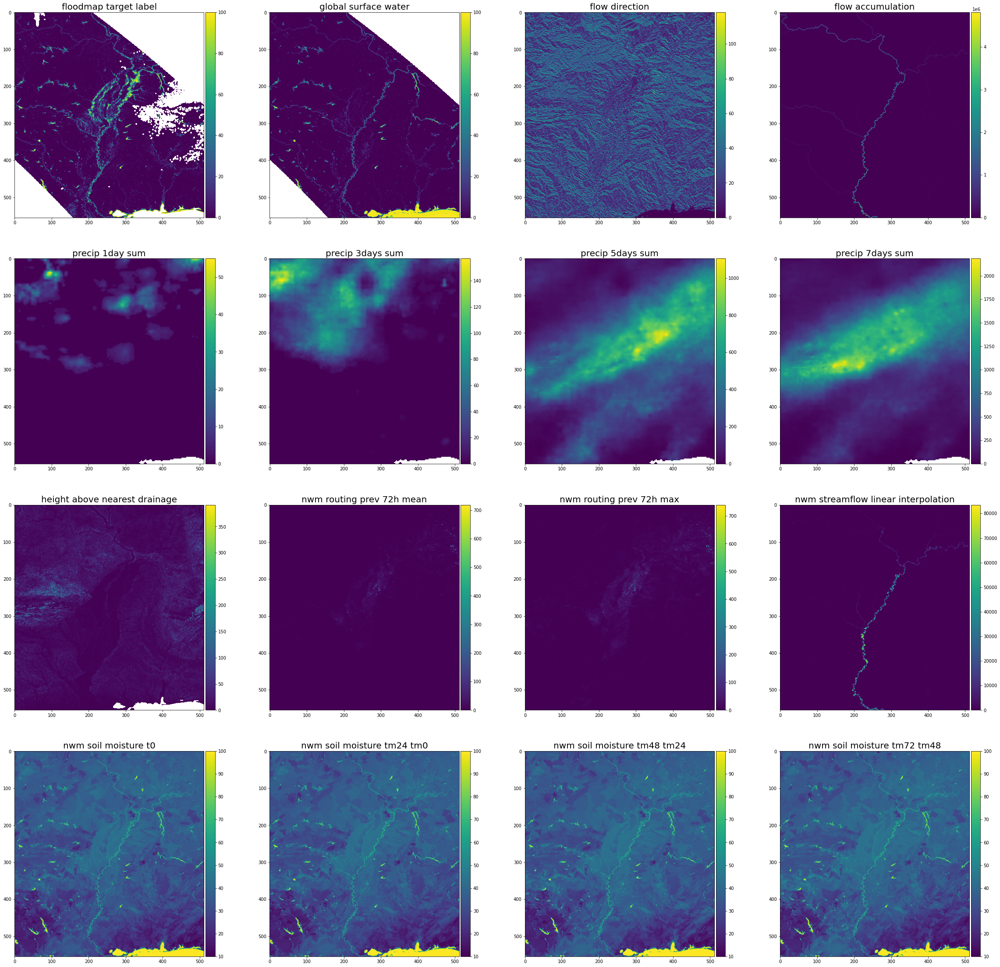

2 MOD09GA.A2008169.h11v04.006.2015175230035__512-1024


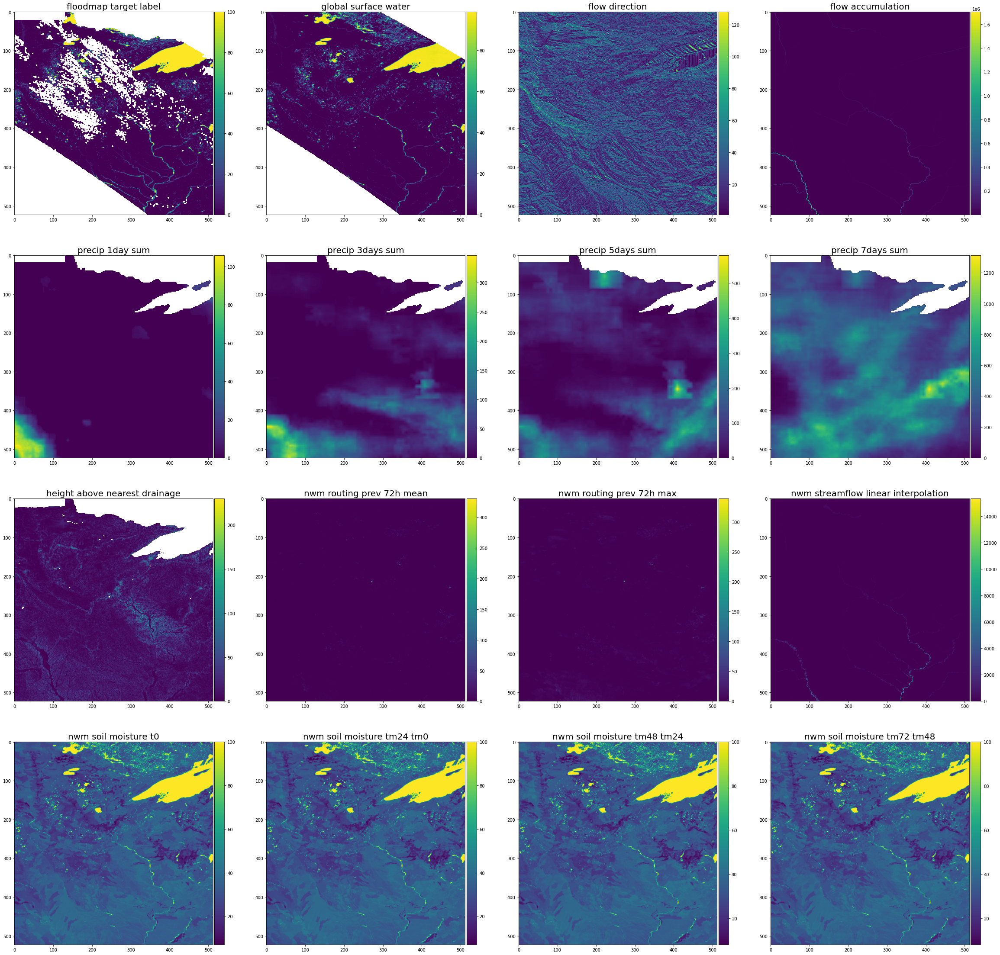

3 MOD09GA.A2001352.h10v05.006.2015146051459__512-1024


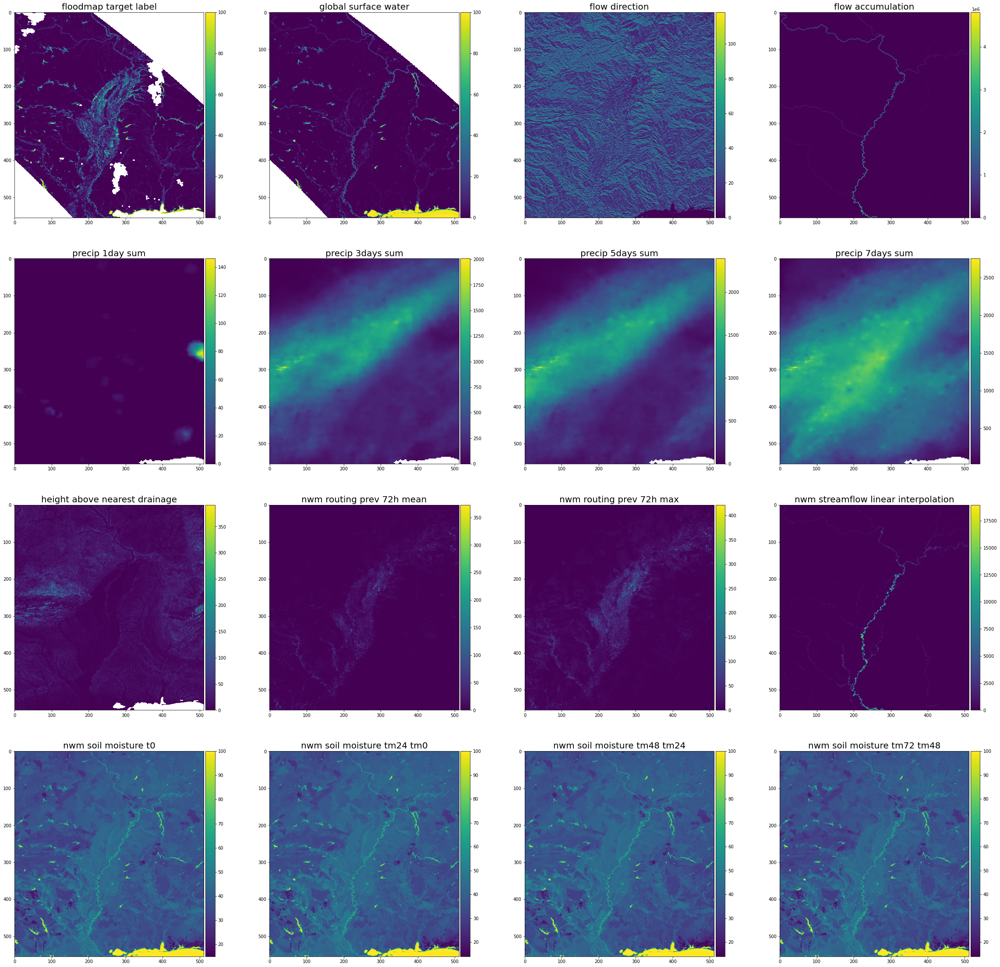

4 MYD09GA.A2005014.h11v05.006.2015098234609__0-512


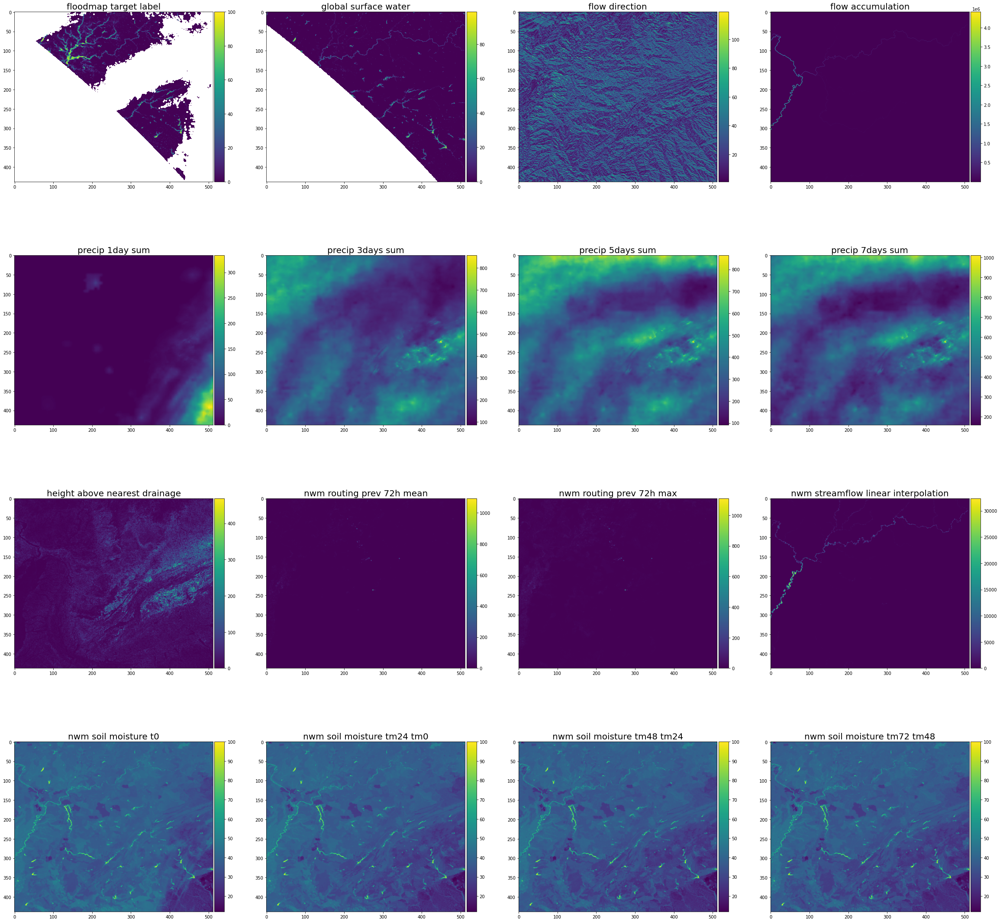

5 MYD09GA.A2006004.h08v05.006.2015113085023__0-512


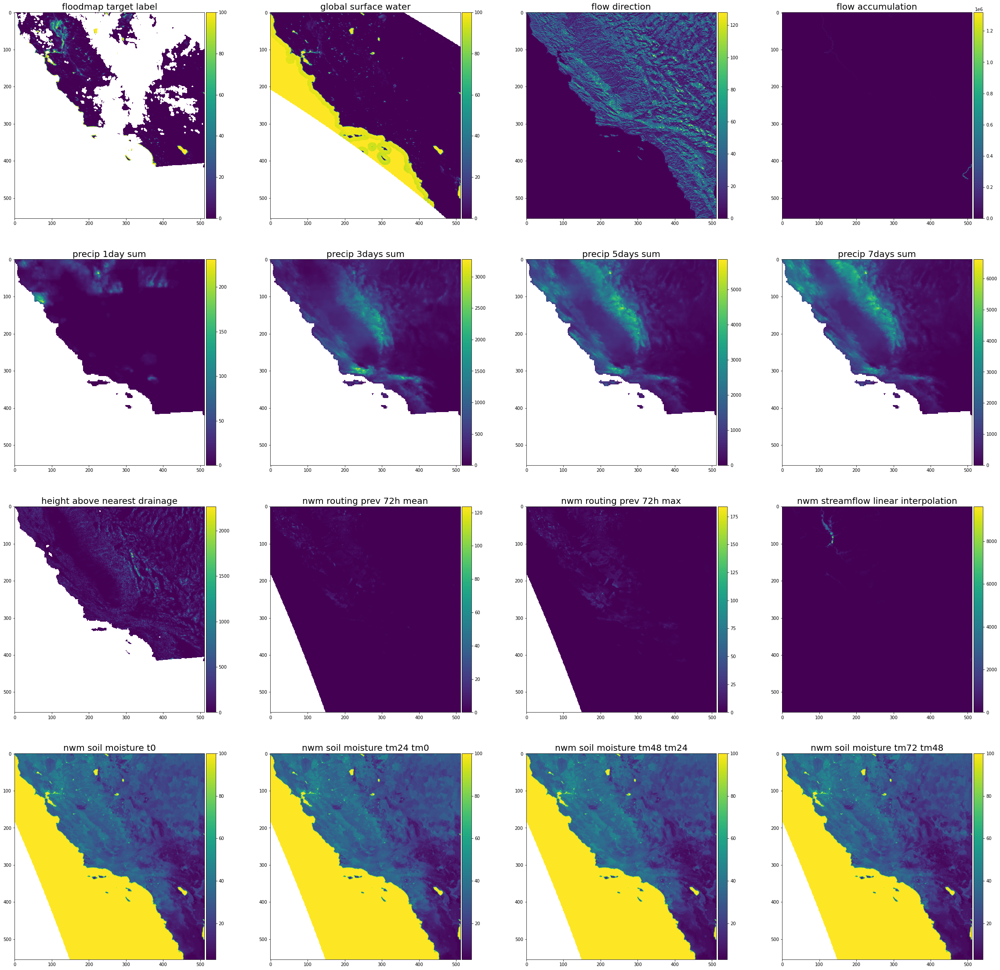

In [ ]:
ncols = 4
nrows = int(np.ceil((len(fields_to_visualize) + 2) / ncols))
for i, row in df.iterrows():
    print(i, row.unique_id)
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40,50))
    axs = axs.flatten()
    [ax.set_visible(False) for ax in axs]
    
    for j, field in enumerate(fields_to_visualize):
        # open the data
        with rio.open(row[field]) as src:
            x = src.read(1)
            # pprint(src.profile) # detailed raster metadata
            x = x.astype(np.float32)
            x[x==src.nodata] = np.nan
        
        # plot
        axs[j].set_visible(True)
        axim = axs[j].imshow(x)
        title = field.replace('_path', '').replace('_', ' ')
        axs[j].set_title(title, fontsize=20)
        divider = make_axes_locatable(axs[j])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(axim, cax=cax)
    plt.show()
    plt.close()   

# Task 2 Model development: how can we improve a model for specific outcomes?

This task is designed to assess:
1. Experience merging dynamic models with data, 
2. Ability to identify practical approaches for scalable solutions to environmental problems, and 
3. Ability to develop innovative approaches to flood mapping, prioritizing scalability and reproducibility.

You can access a recent paper from Neurips (Neural Information Processing Systems) titled “Deep Hydrology: Hourly, Gap-Free Flood MapsThrough Joint Satellite and Hydrologic Modelling” [using this link](https://www.dropbox.com/t/WgY8cAsOEnAE2XLw). 

This paper demonstrates a segmentation model designed to make predictions of satellite-observable water based on state variables from a dynamic model and static geographic layers. The goal of the model described in the paper is to produce flood maps when no such observation is available, as is often the case during flood disasters.

The model described in the paper, like all models, has several limitations, including but not limited to: 
1. Unvalidated performance in urban areas, and 
2. Neglect of impact from coastal storm surge. 

**We ask that you conceptualize a strategy to improve one of those model limitations listed above (or another of your choosing).** You are free to describe a method modifying the approach outlined in the paper, or to develop a completely new approach, but at minimum your conceptual model description should include:
1. Data sources including model inputs and target 
2. Modeling structure 
3. Modeling domain
4. Model output improvements 

Please describe your improvement strategy in no more than 500 words. Images are encouraged to aid in the communication of your strategy, but are not required (model schematics, maps, flowcharts, etc.). The answer can be presented in any common file type the candidate wishes to use.

This question will be graded based on the logical connection of the model inputs, architection, domain and targets. Therefore, it is important to include an explaination of your logic, especially for unintuitive components of the modeling chain.


# Task 3 Model validation: how do we know the usefulness of a model?

This task is designed to assess the candidate's understanding of the skill, effectiveness, usefulness, and limitations of environmental models for real-world use cases. 

**This question will be discussed orally as part of the technical interview, and does not need to be completed when this take home exam is turned in**. We ask that the candidate spend some time thinking through this question and be prepared to discuss their answer in technical details.

The model described in the Neurips paper, and discussed above in Task 2, has produced a prediction of fractional flooded area in an area of interest (AOI) encompassing the Houston Metropolitan Area (Bounded roughly by these coordinates North:  30.04, South: 29.36, East: -94.86, West: -95.71). A single image of the model output is shown below in the next cell.


We would like to develop a broadly applicable recurrence distribution based on a time series of total flood area throughout the AOI (the cell below will load in and plot the time series). We suspect that there are false positives, which potentially cause inflated values for flooded area on the following dates: 
1. November 16th 1998
2. November 6th 2002
3. November 23rd 2004 

**Please be prepared to discuss:** 
1. a plan to determine if the values on those dates are, in fact, false positives, or are they accurate representations of the flooding conditions. This may include (but not neccessisarily and not limited to):
  * possible data sources for validation
  * statistical techniques
2. if false positives exist in our model output, how does that affect our ability to use the model output for a flood recurrence calculation? 

Again, no code or calculations are required for this answer. We will grade this question based on the feasibility, robustness and scalability of the candidate’s response during the next interview.

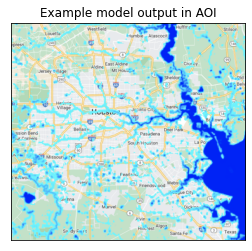

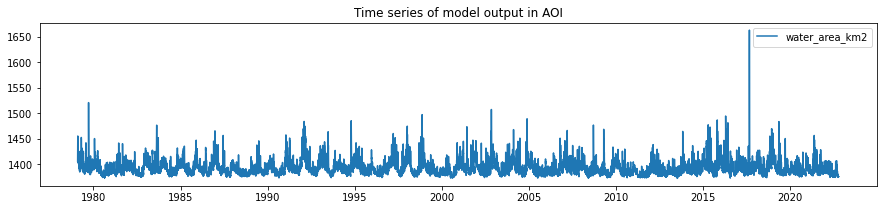

In [ ]:
plt.imshow(mpimg.imread("data/example_houston_model_output.png"))
plt.yticks([])
plt.xticks([])
plt.title("Example model output in AOI")
plt.show()

df = pd.read_csv('./data/model_output_houston_historical_water_area.csv')
dates = [np.datetime64(i) for i in df['dates'].values]
plt.figure(figsize=(15,3))
plt.plot(dates, df['water_area_km2'], label='water_area_km2')
plt.title("Time series of model output in AOI")
plt.legend()
plt.show()
plt.close()